In [1]:
import os
os.environ['HDF5_USE_FILE_LOCKING'] = 'FALSE'

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import re

In [3]:
import sys
sys.path.append('/links/groups/treutlein/USERS/zhisong_he/Tools/')
import scripts.py_util as util
import scripts.py_wknn as wknn

In [4]:
import matplotlib.pyplot as plt

SMALL_SIZE = 6
MEDIUM_SIZE = 8
BIGGER_SIZE = 10

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

# Load data

In [79]:
adata = sc.read_h5ad('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed.h5ad')

In [80]:
str(list(adata.obs.columns))

"['assay_sc', 'assay_differentiation', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_type', 'development_stage', 'disease', 'ethnicity', 'gm', 'id', 'individual', 'organ', 'organism', 'sex', 'state_exact', 'sample_source', 'source_doi', 'suspension_type_original', 'tech_sample', 'treatment', 'assay_sc_original', 'cell_line_original', 'cell_type_original', 'development_stage_original', 'disease_original', 'ethnicity_original', 'organ_original', 'organism_original', 'sex_original', 'suspension_type', 'obs_names_original', 'organoid_age_days', 'publication', 'doi', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'leiden_pca_unintegrated_1', 'leiden_pca_unintegrated_80', 'leiden_pca_rss_1', 'leiden_pca_rss_80', 'snapseed_pca_unintegrated_level_1', 'snapseed_pca_unintegrated_level_2', 'snapseed_pca_unintegrated_level_3', 'snapseed_pca_unintegrated_level_4', 'snapseed_

In [81]:
adata.obs[['publication','cell_type_original']].value_counts(sort=False)

publication     cell_type_original                   
Andersen, 2020  unknown                                    369
Bhaduri, 2020   Astrocyte_Astrocyte                          8
                Endothelial_Endothelial                     73
                Excitatory Neuron _Layer VI Occipital    15465
                Excitatory Neuron _Pan-neuronal          24069
                                                         ...  
Xiang, 2019     Intermediate                                 2
                Mature neuron                               22
                NPC                                          5
                UPRC                                        15
Yoon, 2019      unknown                                   9234
Length: 224, dtype: int64

# Check the original scPoli space

## With the Bhaduri et al. 2020 subset with cell type annotation

In [88]:
adata_bhaduri = adata[adata.obs['publication']=='Bhaduri, 2020',:]

In [89]:
adata_bhaduri.obs = adata[adata.obs['publication']=='Bhaduri, 2020',:].obs.copy()

In [90]:
sc.pp.neighbors(adata_bhaduri, use_rep='X_scpoli')
sc.tl.umap(adata_bhaduri)

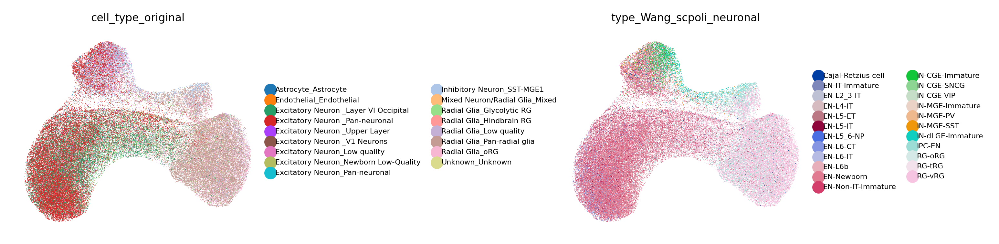

In [91]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (2, 2), 'font.size': 8}):
    sc.pl.umap(adata_bhaduri, color=['cell_type_original','type_Wang_scpoli_neuronal'], size=0.5, frameon=False, add_outline=False, wspace=1, ncols=2, legend_fontsize=4)

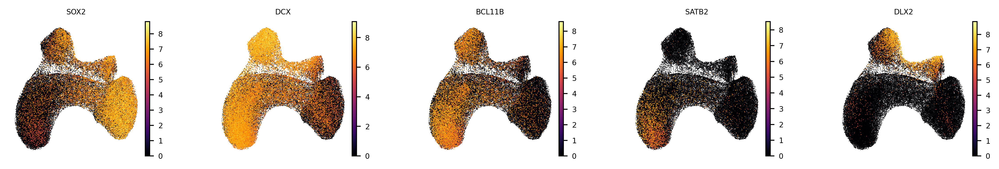

In [96]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (2,2), 'font.size' : 10}):
    sc.pl.embedding(adata_bhaduri, basis='X_umap', color=['SOX2','DCX','BCL11B','SATB2','DLX2'], color_map='inferno', frameon=False, ncols=5, size=1)

In [98]:
sc.tl.louvain(adata_bhaduri)

In [99]:
from sklearn.metrics import adjusted_mutual_info_score
[ adjusted_mutual_info_score(adata_bhaduri.obs['louvain'], adata_bhaduri.obs['cell_type_original']),
  adjusted_mutual_info_score(adata_bhaduri.obs['louvain'], adata_bhaduri.obs['type_Wang_scpoli_neuronal']),
  adjusted_mutual_info_score(adata_bhaduri.obs['cell_type_original'], adata_bhaduri.obs['type_Wang_scpoli_neuronal'])
]

[0.276143143292674, 0.24768018229472277, 0.2176718055994382]

In [102]:
idx = adata_bhaduri.obs['annot_level_1'] == 'Neuron'
from sklearn.metrics import adjusted_mutual_info_score
[ adjusted_mutual_info_score(adata_bhaduri.obs['louvain'][idx], adata_bhaduri.obs['cell_type_original'][idx]),
  adjusted_mutual_info_score(adata_bhaduri.obs['louvain'][idx], adata_bhaduri.obs['type_Wang_scpoli_neuronal'][idx]),
  adjusted_mutual_info_score(adata_bhaduri.obs['cell_type_original'][idx], adata_bhaduri.obs['type_Wang_scpoli_neuronal'][idx])
]

[0.15676112768793193, 0.15385461980671292, 0.09879288131352179]

In [103]:
idx = adata_bhaduri.obs['annot_level_1'] == 'Neuron'
from sklearn.metrics import adjusted_mutual_info_score
[ adjusted_mutual_info_score(adata_bhaduri.obs['louvain'][idx], adata_bhaduri.obs['cell_type_original'][idx]),
  adjusted_mutual_info_score(adata_bhaduri.obs['louvain'][idx], adata_bhaduri.obs['type_Wang_scpoli_neuronal_cl'][idx]),
  adjusted_mutual_info_score(adata_bhaduri.obs['cell_type_original'][idx], adata_bhaduri.obs['type_Wang_scpoli_neuronal_cl'][idx])
]

[0.15676112768793193, 0.24635426835215843, 0.15407634544248813]

In [105]:
idx1 = adata_bhaduri.obs['annot_level_1'] == 'Neuron'
idx2 = adata_bhaduri.obs['annot_level_1'] == 'NPC'
from sklearn.metrics import adjusted_mutual_info_score
[ adjusted_mutual_info_score(adata_bhaduri.obs['type_Wang_scpoli_neuronal_cl'][idx1], adata_bhaduri.obs['type_Wang_scpoli_neuronal'][idx1]),
  adjusted_mutual_info_score(adata_bhaduri.obs['type_Wang_scpoli_neuronal_cl'][idx2], adata_bhaduri.obs['type_Wang_scpoli_neuronal'][idx2]),
  adjusted_mutual_info_score(adata_bhaduri.obs['type_Wang_scpoli_neuronal_cl'], adata_bhaduri.obs['type_Wang_scpoli_neuronal'])
]

[0.19056227182746696, 0.14432797464005528, 0.3076993206949142]

# Redo scPoli on the telencephalic cells only

In [108]:
import scarches
from scipy import sparse

In [109]:
adata.layers.keys()

KeysView(Layers with keys: counts, counts_lengthnorm, counts_raw, lognorm)

In [110]:
sc.pp.highly_variable_genes(adata, layer="counts", n_top_genes=3000, flavor='seurat_v3')

In [111]:
type(adata.layers['counts'])

scipy.sparse._csr.csr_matrix

In [112]:
adata.X = adata.layers['counts'].copy()

In [113]:
adata.raw = adata
adata = adata[:,adata.var['highly_variable']]

## Use annot_level_2 and scPoli-transferred labels

In [187]:
scpoli_model = scarches.models.scpoli.scPoli(
    adata=adata,
    condition_keys='batch',
    cell_type_keys=['type_Wang_scpoli_neuronal_cl','annot_level_2'],
    unknown_ct_names=['Unknown'],
    hidden_layer_sizes=[512],
    latent_dim=20,
    embedding_dims=5,
    recon_loss='nb',
)
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

Embedding dictionary:
 	Num conditions: [328]
 	Embedding dim: [5]
Encoder Architecture:
	Input Layer in, out and cond: 3000 512 5
	Mean/Var Layer in/out: 512 20
Decoder Architecture:
	First Layer in, out and cond:  20 512 5
	Output Layer in/out:  512 3000 



In [188]:
scpoli_model.train(
    n_epochs=30,
    pretraining_epochs=20,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=10,
    alpha_epoch_anneal=20,
    batch_size=32768,
)

Initializing dataloaders
Starting training
 |█████████████-------| 66.7%  - val_loss: 1221.30 - val_cvae_loss: 1221.30
Initializing unlabeled prototypes with Leiden with an unknown number of  clusters.
Clustering succesful. Found 35 clusters.
 |████████████████████| 100.0%  - val_loss: 1333.47 - val_cvae_loss: 1274.96 - val_prototype_loss:   58.50 - val_unlabeled_loss:    2.15 - val_labeled_loss:    5.85


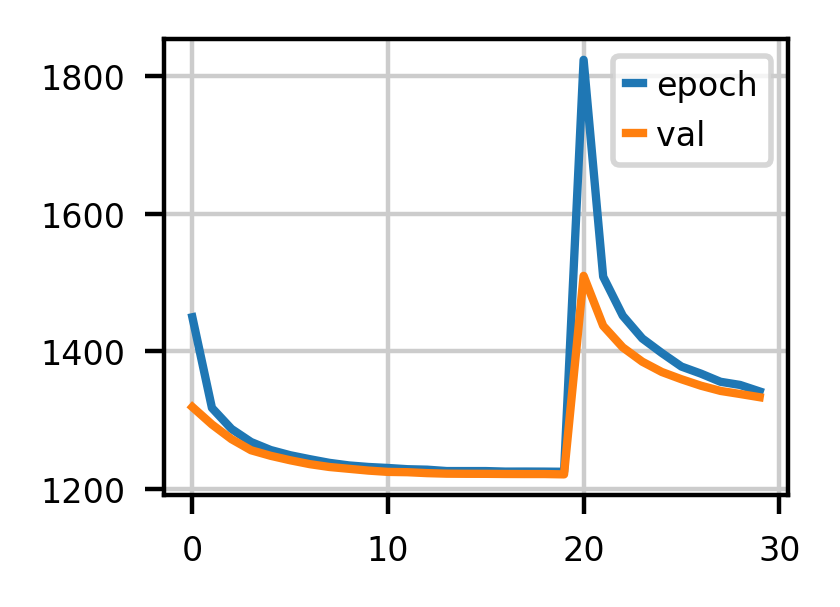

In [189]:
import matplotlib.pyplot as plt
plt.figure(figsize=(2,1.5))
plt.plot(scpoli_model.trainer.logs['epoch_loss'], label='epoch')
plt.plot(scpoli_model.trainer.logs['val_loss'], label='val')
plt.legend()

In [190]:
scpoli_model.save("models_HNOCA/telen/scpoli_annot_l2_Wang_lab_cl", overwrite=True)
scpoli_model.get_conditional_embeddings().write_h5ad("models_HNOCA/telen/scpoli_annot_l2_Wang_lab_cl/sample_embedding.h5ad")

In [191]:
scpoli_model = scarches.models.scPoli.load('models_HNOCA/telen/scpoli_annot_l2_Wang_lab_cl', adata)

AnnData object with n_obs × n_vars = 916132 × 3000
    obs: 'assay_sc', 'assay_differentiation', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_type', 'development_stage', 'disease', 'ethnicity', 'gm', 'id', 'individual', 'organ', 'organism', 'sex', 'state_exact', 'sample_source', 'source_doi', 'suspension_type_original', 'tech_sample', 'treatment', 'assay_sc_original', 'cell_line_original', 'cell_type_original', 'development_stage_original', 'disease_original', 'ethnicity_original', 'organ_original', 'organism_original', 'sex_original', 'suspension_type', 'obs_names_original', 'organoid_age_days', 'publication', 'doi', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'leiden_pca_unintegrated_1', 'leiden_pca_unintegrated_80', 'leiden_pca_rss_1', 'leiden_pca_rss_80', 'snapseed_pca_unintegrated_level_1', 'snapseed_pca_unintegrated_level_2', 'snapseed_pca_unintegrated

In [192]:
adata.obsm["X_scpoli_annot_l2_Wang_lab_cl"] = scpoli_model.get_latent(
    adata,
    mean=True
)
sc.pp.neighbors(adata, use_rep='X_scpoli_annot_l2_Wang_lab_cl')
sc.tl.umap(adata)
adata.obsm['X_umap_scpoli_annot_l2_Wang_lab_cl'] = adata.obsm['X_umap'].copy()

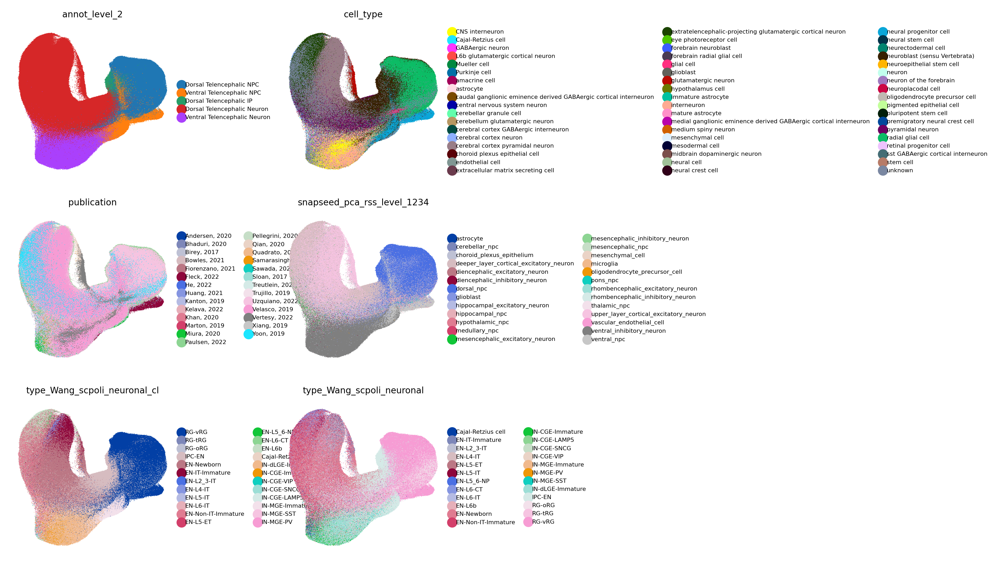

In [194]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (1.8, 2), 'font.size':2}):
    sc.pl.embedding(adata, basis='X_umap_scpoli_annot_l2_Wang_lab_cl',
                    color=['annot_level_2','cell_type','publication','snapseed_pca_rss_level_1234','type_Wang_scpoli_neuronal_cl','type_Wang_scpoli_neuronal'],
                    frameon=False, add_outline=False, wspace=0.5, na_color='lightgray', size=0.5, ncols=2, legend_fontsize=4)

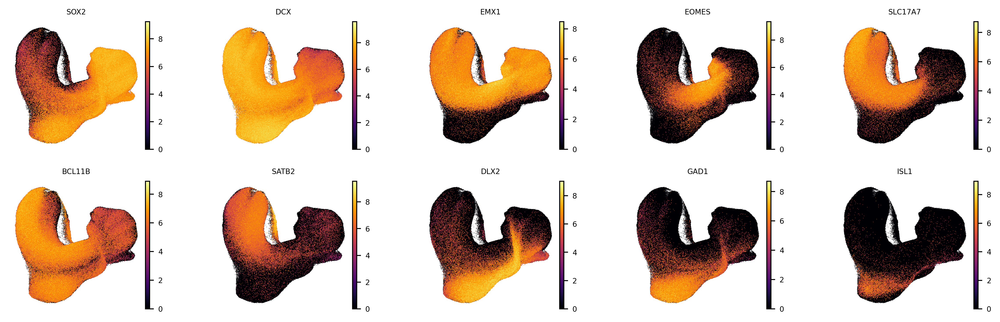

In [202]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (2, 2), 'font.size':2}):
    sc.pl.embedding(adata_raw, basis='X_umap_scpoli_annot_l2_Wang_lab_cl',
                    color=['SOX2','DCX','EMX1','EOMES','SLC17A7','BCL11B','SATB2','DLX2','GAD1','ISL1'],
                    frameon=False, add_outline=False, size=0.6, ncols=5, color_map='inferno')

In [203]:
sc.tl.louvain(adata, resolution=2, key_added='louvain_scpoli_annot_l2_Wang_lab_cl_res2')

In [195]:
adata.write_h5ad('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed_more_scpoli.h5ad')

# Telencephalic cell clusters vs Wang et al. cell types

In [ ]:
adata = sc.read_h5ad('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed_more_scpoli.h5ad')

In [ ]:
adata_raw = sc.read_h5ad('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed.h5ad')

In [33]:
adata.obsm.keys()

KeysView(AxisArrays with keys: X_pca_rss, X_pca_unintegrated, X_rss, X_rss_pca_proj, X_scanvi_Wang, X_scanvi_Wang_neural, X_scanvi_Wang_neuronal, X_scanvi_braun, X_scanvi_braun2, X_scpoli, X_scpoli_Wang, X_scpoli_Wang_neural, X_scpoli_Wang_neuronal, X_scpoli_aggr_1, X_scpoli_aggr_123, X_scpoli_annot_l2_Wang_lab_cl, X_scpoli_telen, X_scpoli_telen_Wang_cl, X_scpoli_telen_snapseed123_celltype_orig, X_scpoli_telen_snapseed_Wang_cl_finest, X_scvi_Wang, X_scvi_Wang_neural, X_scvi_Wang_neuronal, X_umap, X_umap_pca_rss, X_umap_pca_unintegrated, X_umap_scanvi_Wang, X_umap_scanvi_Wang_neural, X_umap_scanvi_Wang_neuronal, X_umap_scanvi_braun, X_umap_scanvi_braun2, X_umap_scpoli, X_umap_scpoli_Wang, X_umap_scpoli_Wang_neural, X_umap_scpoli_Wang_neuronal, X_umap_scpoli_aggr_1, X_umap_scpoli_aggr_123, X_umap_scpoli_annot_l2_Wang_lab_cl, X_umap_scpoli_telen, X_umap_scpoli_telen_only, X_umap_scpoli_telen_only_Wang_cl, X_umap_scpoli_telen_snapseed123_celltype_orig, X_umap_scpoli_telen_snapseed_Wang_cl_

In [36]:
sc.pp.neighbors(adata, use_rep='X_scpoli')
sc.tl.louvain(adata, resolution=1, key_added='louvain_orig_scpoli_res1')
sc.tl.louvain(adata, resolution=2, key_added='louvain_orig_scpoli_res2')

In [37]:
sc.pp.neighbors(adata, use_rep='X_scpoli_annot_l2_Wang_lab_cl')
sc.tl.louvain(adata, resolution=1, key_added='louvain_scpoli_annot_l2_Wang_lab_cl_res1')
sc.tl.louvain(adata, resolution=2, key_added='louvain_scpoli_annot_l2_Wang_lab_cl_res2')

In [40]:
good_samples = adata.obs['batch'].value_counts().loc[lambda x: x > 500].index.astype('str')

adata_samples = [ adata_raw[adata.obs_names[adata.obs['batch'] == x],:].copy() for x in good_samples ]
adata_samples_pro = list()
from tqdm import tqdm
for x in tqdm(adata_samples):
    sc.pp.highly_variable_genes(x, n_top_genes=3000, flavor='seurat')
    x.raw = x
    x = x[:,x.var['highly_variable']]
    sc.pp.scale(x)
    sc.pp.pca(x)
    sc.pp.neighbors(x)
    sc.tl.louvain(x, resolution=1)
    x.obs['louvain'] = x.obs['louvain'].cat.rename_categories([x.obs['batch'][0]+"-"+y for y in x.obs['louvain'].cat.categories])
    adata_samples_pro.append(x)

adata.obs['louvain_per_sample'] = np.nan
cl_per_sample_cont = pd.concat([ x.obs['louvain'] for x in adata_samples_pro ],axis=0)
adata.obs['louvain_per_sample'][cl_per_sample_cont.index] = cl_per_sample_cont

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 221/221 [05:47<00:00,  1.57s/it]


In [45]:
sc.pp.highly_variable_genes(adata_raw, n_top_genes=3000, flavor='seurat')
adata_raw.raw = adata_raw
adata_raw = adata_raw[:,adata_raw.var['highly_variable']]
sc.pp.scale(adata_raw)
sc.pp.pca(adata_raw)
sc.pp.neighbors(adata_raw)
sc.tl.louvain(adata_raw, resolution = 1, key_added='louvain_unintegrated_res1')
sc.tl.louvain(adata_raw, resolution = 2, key_added='louvain_unintegrated_res2')
adata.obs['louvain_unintegrated_res1'] = adata_raw.obs['louvain_unintegrated_res1'][adata.obs_names]
adata.obs['louvain_unintegrated_res2'] = adata_raw.obs['louvain_unintegrated_res2'][adata.obs_names]

In [70]:
from sklearn.metrics import adjusted_mutual_info_score
s1 = [ adjusted_mutual_info_score(adata.obs['louvain_orig_scpoli_res2'][(adata.obs['batch']==x) & (adata.obs['annot_level_1']=='Neuron')],
                                  adata.obs['type_Wang_scpoli_neuronal_cl'][(adata.obs['batch']==x) & (adata.obs['annot_level_1']=='Neuron')]) for x in good_samples ]
s2 = [ adjusted_mutual_info_score(adata.obs['louvain_scpoli_annot_l2_Wang_lab_cl_res2'][(adata.obs['batch']==x) & (adata.obs['annot_level_1']=='Neuron')],
                                  adata.obs['type_Wang_scpoli_neuronal_cl'][(adata.obs['batch']==x) & (adata.obs['annot_level_1']=='Neuron')]) for x in good_samples ]
s3 = [ adjusted_mutual_info_score(adata.obs['louvain_unintegrated_res2'][(adata.obs['batch']==x) & (adata.obs['annot_level_1']=='Neuron')],
                                  adata.obs['type_Wang_scpoli_neuronal_cl'][(adata.obs['batch']==x) & (adata.obs['annot_level_1']=='Neuron')]) for x in good_samples ]
s4 = [ adjusted_mutual_info_score(adata.obs['louvain_per_sample'][(adata.obs['batch']==x) & (adata.obs['annot_level_1']=='Neuron')],
                                  adata.obs['type_Wang_scpoli_neuronal_cl'][(adata.obs['batch']==x) & (adata.obs['annot_level_1']=='Neuron')]) for x in good_samples ]
ami_per_sample_n = pd.concat([pd.DataFrame(s1),pd.DataFrame(s2),pd.DataFrame(s3),pd.DataFrame(s4)], axis=1).set_axis(['Orig_scPoli','Reemb_scPoli','Merged','PerSample'], axis=1).set_index(good_samples)

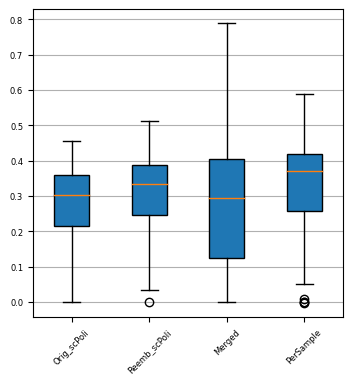

In [71]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (4, 4)}):
    plt.boxplot(ami_per_sample_n, patch_artist=True)
    plt.grid(axis='y')
    plt.xticks(list(range(1,5)), ami_per_sample_n.columns, rotation=45)
    plt.show()

In [67]:
adata.write_h5ad('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed_more_scpoli.h5ad')

# Telencephalic neuron clusters vs Wang et al. cell types

In [5]:
adata = sc.read_h5ad('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed_more_scpoli.h5ad')

In [207]:
adata.obs['annot_level_2'].value_counts()

Dorsal Telencephalic Neuron     518082
Dorsal Telencephalic NPC        224111
Ventral Telencephalic Neuron    112006
Ventral Telencephalic NPC        46500
Dorsal Telencephalic IP          15433
Name: annot_level_2, dtype: int64

In [212]:
adata.obs['class_Wang_scpoli_neuronal_cl'].value_counts()

Neuron        532691
Progenitor    383441
Name: class_Wang_scpoli_neuronal_cl, dtype: int64

In [215]:
adata_dorsaln = adata[((adata.obs['annot_level_2']=='Dorsal Telencephalic Neuron') & (adata.obs['class_Wang_scpoli_neuronal_cl']=='Neuron')),:]
adata_ventraln = adata[((adata.obs['annot_level_2']=='Ventral Telencephalic Neuron') & (adata.obs['class_Wang_scpoli_neuronal_cl']=='Neuron')),:]

In [ ]:
import os

if os.path.isfile('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed_dorsaln.h5ad'):
    adata_dorsaln = sc.read_h5ad('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed_dorsaln.h5ad')
else:
    adata_dorsaln = adata[((adata.obs['annot_level_2']=='Dorsal Telencephalic Neuron') & (adata.obs['class_Wang_scpoli_neuronal_cl']=='Neuron')),:]

if os.path.isfile('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed_ventraln.h5ad'):
    adata_ventraln = sc.read_h5ad('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed_ventraln.h5ad')
else:
    adata_ventraln = adata[((adata.obs['annot_level_2']=='Ventral Telencephalic Neuron') & (adata.obs['class_Wang_scpoli_neuronal_cl']=='Neuron')),:]

## Dorsal telencephalic neurons

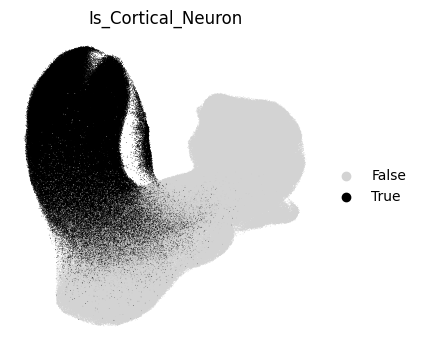

In [10]:
adata.obs['Is_Cortical_Neuron'] = ((adata.obs['annot_level_2']=='Dorsal Telencephalic Neuron') & (adata.obs['class_Wang_scpoli_neuronal_cl']=='Neuron')).astype('category')
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize' : (4,4)}):
    sc.pl.embedding(adata, basis='X_umap_scpoli_annot_l2_Wang_lab_cl', color=['Is_Cortical_Neuron'], palette=['lightgrey','black'], frameon=False, add_outline=False, size=1)
del adata.obs['Is_Cortical_Neuron']

In [7]:
sc.pp.neighbors(adata_dorsaln, use_rep='X_scpoli')
sc.tl.louvain(adata_dorsaln, resolution=1, key_added='louvain_orig_scpoli_dorsaln_res1')
sc.tl.louvain(adata_dorsaln, resolution=2, key_added='louvain_orig_scpoli_dorsaln_res2')

### Clustering and UMAP based on the estimated scPoli

In [216]:
sc.pp.neighbors(adata_dorsaln, use_rep='X_scpoli_annot_l2_Wang_lab_cl')
sc.tl.louvain(adata_dorsaln, resolution=1, key_added='louvain_dorsaln_res1')
sc.tl.louvain(adata_dorsaln, resolution=2, key_added='louvain_dorsaln_res2')
sc.tl.louvain(adata_dorsaln, resolution=10, key_added='louvain_dorsaln_res10')

In [217]:
sc.tl.umap(adata_dorsaln)

In [10]:
adata_dorsaln.obsm['X_umap_scpoli_annot_l2_Wang_lab_cl_redone'] = adata_dorsaln.obsm['X_umap'].copy()

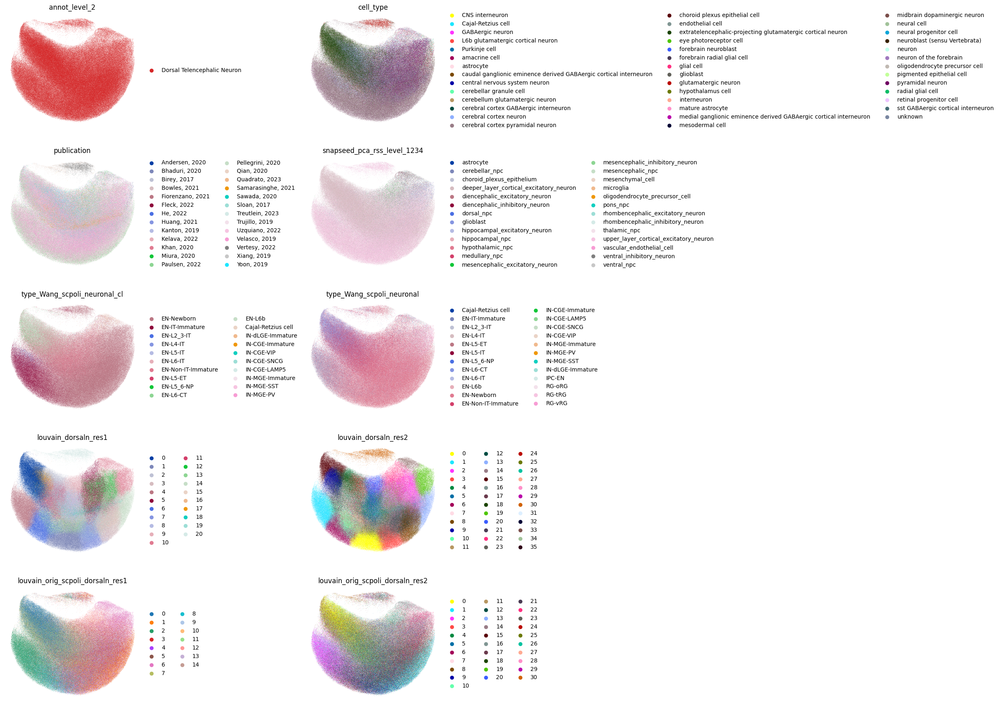

In [13]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (3.5, 4)}):
    sc.pl.umap(adata_dorsaln,
                    color=['annot_level_2','cell_type',
                           'publication','snapseed_pca_rss_level_1234',
                           'type_Wang_scpoli_neuronal_cl','type_Wang_scpoli_neuronal',
                           'louvain_dorsaln_res1','louvain_dorsaln_res2',
                           'louvain_orig_scpoli_dorsaln_res1','louvain_orig_scpoli_dorsaln_res2'],
                    frameon=False, add_outline=False, wspace=1, na_color='lightgray', size=0.5, ncols=2)

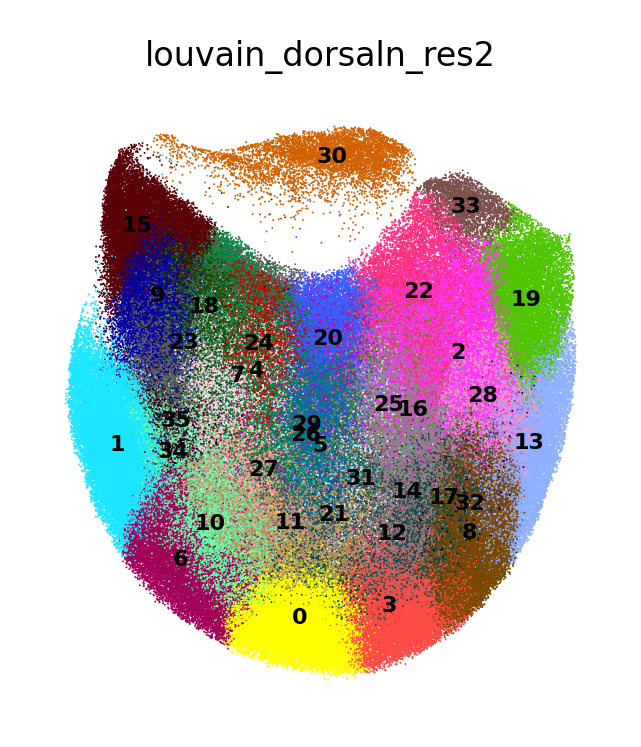

In [231]:
with rc_context({'figure.figsize': (1.8, 2), 'font.size':2}):
    sc.pl.umap(adata_dorsaln,
               color=['louvain_dorsaln_res2'],
               frameon=False, add_outline=False, size=0.5, legend_fontsize=4, legend_loc='on data')

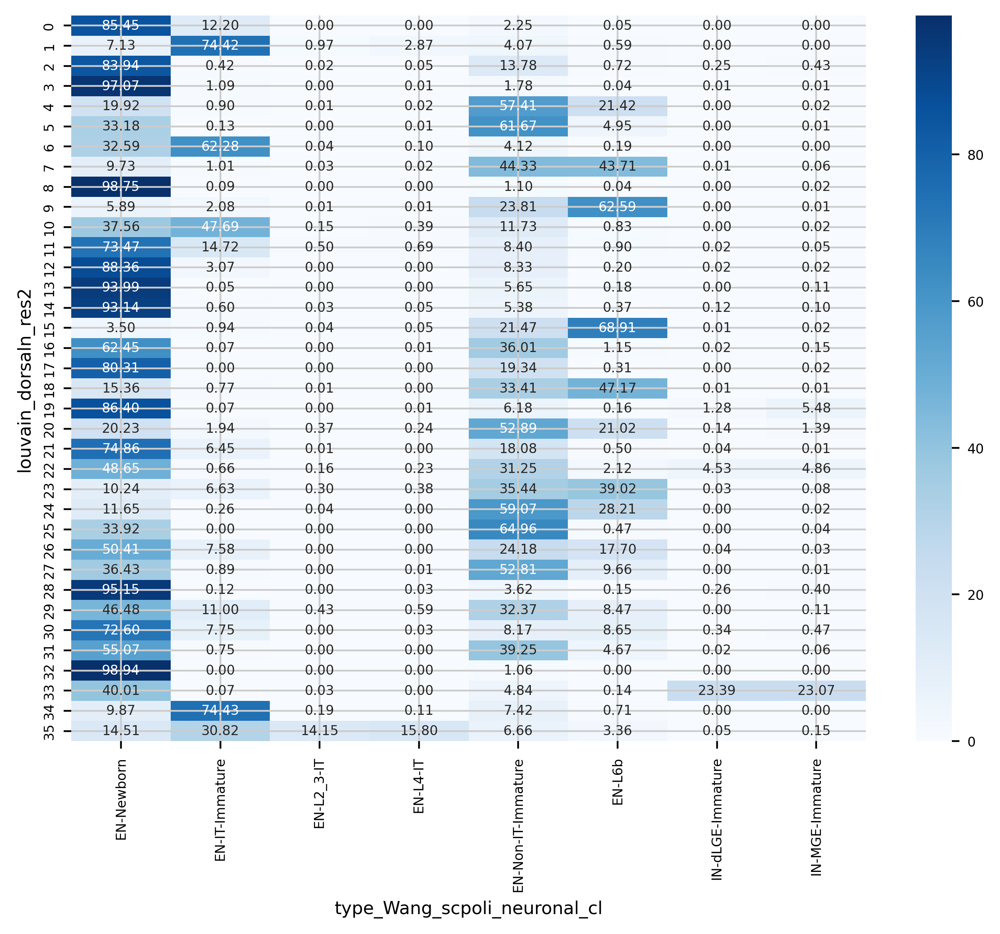

In [229]:
freq = pd.crosstab(adata_dorsaln.obs['louvain_dorsaln_res2'], adata_dorsaln.obs['type_Wang_scpoli_neuronal_cl'])
prop = freq.apply(lambda x: x/np.sum(x), axis=1)
idx_col = (freq.sum(axis=0) > 100) & (prop.max(axis=0) > 0.1)

import seaborn as sns
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (8, 6)}):
    sns.heatmap(prop.loc[:,idx_col]*100, annot=True, cmap='Blues', fmt='.2f')

In [240]:
adata_dorsaln.write_h5ad('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed_dorsaln.h5ad')

### Clustering and UMAP without integration

In [22]:
adata_dorsaln_raw = adata_raw[adata_dorsaln.obs_names,:].copy()

In [23]:
sc.pp.highly_variable_genes(adata_dorsaln_raw, layer="counts", n_top_genes=3000, flavor='seurat_v3')
adata_dorsaln_raw.raw = adata_dorsaln_raw
adata_dorsaln_raw = adata_dorsaln_raw[:,adata_dorsaln_raw.var['highly_variable']]
sc.pp.scale(adata_dorsaln_raw)
sc.pp.pca(adata_dorsaln_raw)
sc.pp.neighbors(adata_dorsaln_raw)
sc.tl.umap(adata_dorsaln_raw)

In [25]:
sc.tl.louvain(adata_dorsaln_raw, resolution = 2, key_added='louvain_unintegrated_res2')

In [26]:
sc.tl.louvain(adata_dorsaln_raw, resolution = 1, key_added='louvain_unintegrated_res1')

In [30]:
adata_dorsaln.obs['louvain_unintegrated_res1'] = adata_dorsaln_raw.obs['louvain_unintegrated_res1'][adata_dorsaln.obs_names]
adata_dorsaln.obs['louvain_unintegrated_res2'] = adata_dorsaln_raw.obs['louvain_unintegrated_res2'][adata_dorsaln.obs_names]

### Clustering per sample

In [19]:
good_samples = adata_dorsaln.obs['batch'].value_counts().loc[lambda x: x > 500].index.astype('str')
good_samples[:5]

Index(['homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0---homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)_guided_10_Least Directed_H1---homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)_guided_10_Least Directed_H1',
       'homosapiens_telencephalon_2019_10x3v2_velascosilvia_003_d10_1038_s41586_019_1289_x---homosapiens_telencephalon_2019_10x3v2_velascosilvia_003_d10_1038_s41586_019_1289_x9---homosapiens_telencephalon_2019_10x3v2_velascosilvia_003_d10_1038_s41586_019_1289_x9',
       'homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0---homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); directed_guided_10_Directed_1323_4---homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0Bhaduri, 2020 (doi: 10.1038/s41586-0

In [17]:
adata_dorsaln_samples = [ adata_raw[adata_dorsaln.obs_names[adata_dorsaln.obs['batch'] == x],:].copy() for x in good_samples ]
len(adata_dorsaln_samples)

154

In [31]:
adata_dorsaln_samples_pro = list()
from tqdm import tqdm
for x in tqdm(adata_dorsaln_samples):
    sc.pp.highly_variable_genes(x, layer="counts", n_top_genes=3000, flavor='seurat_v3')
    x.raw = x
    x = x[:,x.var['highly_variable']]
    sc.pp.scale(x)
    sc.pp.pca(x)
    sc.pp.neighbors(x)
    sc.tl.louvain(x, resolution=1)
    x.obs['louvain'] = x.obs['louvain'].cat.rename_categories([x.obs['batch'][0]+"-"+y for y in x.obs['louvain'].cat.categories])
    adata_dorsaln_samples_pro.append(x)

100%|██████████| 154/154 [03:52<00:00,  1.51s/it]


In [32]:
adata_dorsaln.obs['louvain_per_sample'] = np.nan
cl_per_sample_cont = pd.concat([ x.obs['louvain'] for x in adata_dorsaln_samples_pro ],axis=0)
adata_dorsaln.obs['louvain_per_sample'][cl_per_sample_cont.index] = cl_per_sample_cont

In [65]:
adata_dorsaln.write_h5ad('../../data/phase3_final_0516/ZH_processed_telen_map2Wang-ed_dorsaln.h5ad')

In [20]:
# original leiden clustering
from sklearn.metrics import adjusted_mutual_info_score
s0 = [ adjusted_mutual_info_score(adata_dorsaln.obs['leiden_scpoli_2'][adata_dorsaln.obs['batch']==x], adata_dorsaln.obs['type_Wang_scpoli_neuronal_cl'][adata_dorsaln.obs['batch']==x]) for x in good_samples ]
pd.Series(s0).describe()

count    154.000000
mean       0.221236
std        0.096130
min        0.012348
25%        0.142094
50%        0.221825
75%        0.284042
max        0.464751
dtype: float64

In [21]:
# louvain clustering based on original scpoli
from sklearn.metrics import adjusted_mutual_info_score
s1 = [ adjusted_mutual_info_score(adata_dorsaln.obs['louvain_orig_scpoli_dorsaln_res2'][adata_dorsaln.obs['batch']==x], adata_dorsaln.obs['type_Wang_scpoli_neuronal_cl'][adata_dorsaln.obs['batch']==x]) for x in good_samples ]
pd.Series(s1).describe()

count    154.000000
mean       0.190130
std        0.083520
min        0.011519
25%        0.115067
50%        0.196267
75%        0.255886
max        0.388003
dtype: float64

In [22]:
# louvain clustering based on reembedded scpoli
from sklearn.metrics import adjusted_mutual_info_score
s2 = [ adjusted_mutual_info_score(adata_dorsaln.obs['louvain_dorsaln_res2'][adata_dorsaln.obs['batch']==x], adata_dorsaln.obs['type_Wang_scpoli_neuronal_cl'][adata_dorsaln.obs['batch']==x]) for x in good_samples ]
pd.Series(s2).describe()

count    154.000000
mean       0.206933
std        0.079613
min        0.049144
25%        0.139735
50%        0.207477
75%        0.276579
max        0.380347
dtype: float64

In [25]:
# louvain clustering based on unintegrated pca
from sklearn.metrics import adjusted_mutual_info_score
s3 = [ adjusted_mutual_info_score(adata_dorsaln.obs['louvain_unintegrated_res2'][adata_dorsaln.obs['batch']==x], adata_dorsaln.obs['type_Wang_scpoli_neuronal_cl'][adata_dorsaln.obs['batch']==x]) for x in good_samples ]
pd.Series(s3).describe()

count    154.000000
mean       0.131347
std        0.112356
min       -0.000647
25%        0.022529
50%        0.122834
75%        0.244216
max        0.361276
dtype: float64

In [26]:
# louvain clustering based on per sample clustering
from sklearn.metrics import adjusted_mutual_info_score
s4 = [ adjusted_mutual_info_score(adata_dorsaln.obs['louvain_per_sample'][adata_dorsaln.obs['batch']==x], adata_dorsaln.obs['type_Wang_scpoli_neuronal_cl'][adata_dorsaln.obs['batch']==x]) for x in good_samples ]
pd.Series(s4).describe()

count    154.000000
mean       0.233214
std        0.095342
min        0.049639
25%        0.156422
50%        0.242226
75%        0.309568
max        0.501092
dtype: float64

In [27]:
ami_per_sample = pd.concat([pd.DataFrame(s1),pd.DataFrame(s2),pd.DataFrame(s3),pd.DataFrame(s4)], axis=1).set_axis(['Orig_scPoli','Reemb_scPoli','Merged','PerSample'], axis=1).set_index(good_samples)
ami_per_sample

,Orig_scPoli,Reemb_scPoli,Merged,PerSample
"homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0---homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)_guided_10_Least Directed_H1---homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0Velasco, 2019 (doi: 10.1038/s41586-019-1289-x)_guided_10_Least Directed_H1",0.063992,0.093946,0.000488,0.127618
homosapiens_telencephalon_2019_10x3v2_velascosilvia_003_d10_1038_s41586_019_1289_x---homosapiens_telencephalon_2019_10x3v2_velascosilvia_003_d10_1038_s41586_019_1289_x9---homosapiens_telencephalon_2019_10x3v2_velascosilvia_003_d10_1038_s41586_019_1289_x9,0.216767,0.229234,0.150902,0.254696
"homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0---homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); directed_guided_10_Directed_1323_4---homosapiens_None_2020_10x3v2_bhaduriaparna_001_d10_1038_s41586_020_1962_0Bhaduri, 2020 (doi: 10.1038/s41586-020-1962-0); directed_guided_10_Directed_1323_4",0.136734,0.154936,0.002354,0.183748
homosapiens_telencephalon_2019_10x3v2_velascosilvia_004_d10_1038_s41586_019_1289_x---homosapiens_telencephalon_2019_10x3v2_velascosilvia_004_d10_1038_s41586_019_1289_x6---homosapiens_telencephalon_2019_10x3v2_velascosilvia_004_d10_1038_s41586_019_1289_x6,0.171534,0.183166,0.074726,0.237474
homosapiens_telencephalon_2019_10x3v2_velascosilvia_003_d10_1038_s41586_019_1289_x---homosapiens_telencephalon_2019_10x3v2_velascosilvia_003_d10_1038_s41586_019_1289_x7---homosapiens_telencephalon_2019_10x3v2_velascosilvia_003_d10_1038_s41586_019_1289_x7,0.218786,0.243766,0.152411,0.281523
...,...,...,...,...
homosapiens_brain_2022_10x3v2_uzquianoana_013_d10_1016_j_cell_2022_09_010---homosapiens_brain_2022_10x3v2_uzquianoana_013_d10_1016_j_cell_2022_09_010Quad-7---homosapiens_brain_2022_10x3v2_uzquianoana_013_d10_1016_j_cell_2022_09_010Quad-7,0.101050,0.157101,0.081160,0.177140
homosapiens_brain_2019_10x3v2_kantonsabina_001_d10_1038_s41586_019_1654_9---homosapiens_brain_2019_10x3v2_kantonsabina_001_d10_1038_s41586_019_1654_9sojd_HipSci_3---homosapiens_brain_2019_10x3v2_kantonsabina_001_d10_1038_s41586_019_1654_9sojd_HipSci_3,0.197236,0.234190,0.123741,0.326592
homosapiens_telencephalon_2022_10x3v3_paulsenbruna_015_d10_1038_s41586_021_04358_6---homosapiens_telencephalon_2022_10x3v3_paulsenbruna_015_d10_1038_s41586_021_04358_6ARID1B_2---homosapiens_telencephalon_2022_10x3v3_paulsenbruna_015_d10_1038_s41586_021_04358_6ARID1B_2,0.098690,0.067331,0.037568,0.052940
homosapiens_telencephalon_2022_10x3v3_paulsenbruna_009_d10_1038_s41586_021_04358_6---homosapiens_telencephalon_2022_10x3v3_paulsenbruna_009_d10_1038_s41586_021_04358_6SUV_8---homosapiens_telencephalon_2022_10x3v3_paulsenbruna_009_d10_1038_s41586_021_04358_6SUV_8,0.119199,0.123032,0.001822,0.108883


In [29]:
ami_per_sample.to_csv('outputs/Wang/tab_ami_per_sample.tsv', sep='\t')

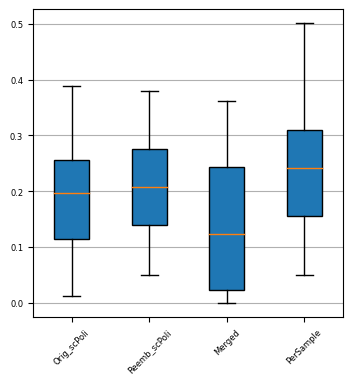

In [28]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (4, 4)}):
    plt.boxplot(ami_per_sample, patch_artist=True)
    plt.grid(axis='y')
    plt.xticks(list(range(1,5)), ami_per_sample.columns, rotation=45)
    plt.show()

In [64]:
from scipy.stats import wilcoxon
from scipy.stats import ranksums
[
    wilcoxon(ami_per_sample['Orig_scPoli'], ami_per_sample['Reemb_scPoli'], alternative='less'),
    ranksums(ami_per_sample['Orig_scPoli'], ami_per_sample['Reemb_scPoli'], alternative='less')
]

[WilcoxonResult(statistic=1748.0, pvalue=1.3563354198998713e-14),
 RanksumsResult(statistic=-1.754397974497722, pvalue=0.039681169085633225)]